In [1]:
# use CEASELESS kernel for adrien laptop notebook

import os
import xarray as xr
import numpy as np
import numpy.ma as ma
import matplotlib.pyplot as plt
import cartopy.crs as ccrs # => to add in Seastar env

from scipy import interpolate, stats # => to add in Seastar env ?

import seastar as ss

In [3]:
version = 'v2'
folder = '/Brest_Sample_Sept_29_2022/'
oscar_data_folder = "~/OneDrive/OneDrive - NOC/Documents/NOC-OneDrive/workLocal/SEASTAR/DATA/OSCAR/"

In [4]:
dirIn = oscar_data_folder + version + folder
list17 = [
    'SAR_CPLX_20220517T093239_13.5G_VV_00_pres_1_fdc_auto.sar.sig.nc',
    'SAR_CPLX_20220517T093239_13.5G_VV_33_pres_1_fdc_auto.sar.sig_INF_SAR_CPLX_20220517T093239_13.5G_VV_34_pres_1_fdc_auto.sar.sig.nc',
    'SAR_CPLX_20220517T093239_13.5G_VV_77_pres_1_fdc_auto.sar.sig_INF_SAR_CPLX_20220517T093239_13.5G_VV_78_pres_1_fdc_auto.sar.sig.nc'
]

list25land = [
    'SAR_CPLX_20220525T080646_13.5G_VV_00_pres_1_fdc_auto.sar.sig.nc',
    'SAR_CPLX_20220525T080646_13.5G_VV_33_pres_1_fdc_auto.sar.sig_INF_SAR_CPLX_20220525T080646_13.5G_VV_34_pres_1_fdc_auto.sar.sig.nc',
    'SAR_CPLX_20220525T080646_13.5G_VV_77_pres_1_fdc_auto.sar.sig_INF_SAR_CPLX_20220525T080646_13.5G_VV_78_pres_1_fdc_auto.sar.sig.nc'
]

list25ocean = [
    'SAR_CPLX_20220525T085452_13.5G_VV_00_pres_1_fdc_auto.sar.sig.nc',
    'SAR_CPLX_20220525T085452_13.5G_VV_33_pres_1_fdc_auto.sar.sig_INF_SAR_CPLX_20220525T085452_13.5G_VV_34_pres_1_fdc_auto.sar.sig.nc',
    'SAR_CPLX_20220525T085452_13.5G_VV_77_pres_1_fdc_auto.sar.sig_INF_SAR_CPLX_20220525T085452_13.5G_VV_78_pres_1_fdc_auto.sar.sig.nc'
]

In [5]:
def computeL1b(ds, window=3): # window 5x5 to 7x7
#     ds['SigmaSLCMaster'] = ds.SigmaImageSingleLookRealPart  + 1j * ds.SigmaImageSingleLookImaginaryPart
    ds['SigmaSLCMaster'] = ( ds.SigmaImageSingleLookRealPart  + 1j * ds.SigmaImageSingleLookImaginaryPart )

    ds['SigmaImageIntensity'] = np.abs( ds.SigmaSLCMaster )
    if 'SigmaImageSingleLookRealPartSlave' in ds.data_vars:
#         ds['SigmaSLCSlave'] = ds.SigmaImageSingleLookRealPartSlave  + 1j * ds.SigmaImageSingleLookImaginaryPartSlave
        ds['SigmaSLCSlave'] = ( ds.SigmaImageSingleLookRealPartSlave  + 1j * ds.SigmaImageSingleLookImaginaryPartSlave )
        ds['I_avg'] = ( ds.SigmaSLCMaster * np.conjugate(ds.SigmaSLCSlave) ).rolling(GroundRange=window).mean().rolling(CrossRange=window).mean()
        ds['interferogram'] = (
            ['CrossRange', 'GroundRange'],
            np.angle( ds.I_avg, deg=False )
        )
        ds['master_avg'] = ( np.abs(ds.SigmaSLCMaster)**2 ).rolling(GroundRange=window).mean().rolling(CrossRange=window).mean()
        ds['slave_avg'] = ( np.abs(ds.SigmaSLCSlave)**2 ).rolling(GroundRange=window).mean().rolling(CrossRange=window).mean()
        ds['coherence'] = np.abs( ds.I_avg )\
            / np.sqrt( ds['master_avg'] * ds['slave_avg'])
    return ds

In [6]:
dirIn = "~/OneDrive/OneDrive - NOC/Documents/NOC-OneDrive/workLocal/SEASTAR/DATA/OSCAR/" + version + folder


In [7]:
dsm = xr.open_dataset(
    dirIn + list17[0],
)
dsm['flag_down'] = dsm.SigmaImageSingleLookRealPart != -9999.
dsm = computeL1b( dsm, window=7 )

In [8]:
dsf = xr.open_dataset(
    dirIn + list17[1],
)
dsf['flag_down'] = dsf.SigmaImageSingleLookRealPart != -9999.
dsf = computeL1b( dsf, window=7 )

/Users/admartin/opt/anaconda3/envs/CEASELESS_Sentinel1_RVL/lib/python3.7/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)


In [9]:
dsa = xr.open_dataset(
    dirIn + list17[2],
)
dsa['flag_down'] = dsa.SigmaImageSingleLookRealPart != -9999.
dsa = computeL1b( dsa, window=7 )

/Users/admartin/opt/anaconda3/envs/CEASELESS_Sentinel1_RVL/lib/python3.7/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)


In [10]:
dsm

<xarray.Dataset>
Dimensions:                            (AntPatternAngles: 201, CrossRange: 2091, GBPGridInfo: 9, GPSTime: 1297800, GroundRange: 474, ModelTransformationTagCols: 4, ModelTransformationTagRows: 4)
Coordinates:
  * GroundRange                        (GroundRange) float32 1040.0 ... 4824.0
  * CrossRange                         (CrossRange) float32 -8296.0 ... 8424.0
  * GPSTime                            (GPSTime) float64 2.072e+05 ... 2.073e+05
  * AntPatternAngles                   (AntPatternAngles) float64 -90.0 ... 90.0
  * GBPGridInfo                        (GBPGridInfo) float64 3.447e+05 ... -0...
Dimensions without coordinates: ModelTransformationTagCols, ModelTransformationTagRows
Data variables:
    SigmaImageSingleLookRealPart       (CrossRange, GroundRange) float64 -9.9...
    SigmaImageSingleLookImaginaryPart  (CrossRange, GroundRange) float64 0.0 ...
    LatImage                           (CrossRange, GroundRange) float64 ...
    LonImage                           (CrossRange, GroundRange) float64 ...
    DEMImage                           (CrossRange, GroundRange) float32 ...
    OrbLatImage                        (CrossRange, GroundRange) float64 ...
    OrbLonImage                        (CrossRange, GroundRange) float64 ...
    OrbHeightImage                     (CrossRange, GroundRange) float64 ...
    OrbTimeImage                       (CrossRange, GroundRange) float64 ...
    CalImage                           (CrossRange, GroundRange) float32 ...
    OrbitImage                         (CrossRange, GroundRange) float32 ...
    OrbitLatitude                      (GPSTime) float64 ...
    OrbitLongitude                     (GPSTime) float64 ...
    OrbitHeight                        (GPSTime) float64 ...
    OrbitHeading                       (GPSTime) float64 ...
    OrbitRoll                          (GPSTime) float64 ...
    OrbitPitch                         (GPSTime) float64 ...
    TxElevationGain                    (AntPatternAngles) float64 ...
    TxAzimuthGain                      (AntPatternAngles) float64 ...
    RxElevationGain                    (AntPatternAngles) float64 ...
    RxAzimuthGain                      (AntPatternAngles) float64 ...
    ModelTransformationTag             (ModelTransformationTagCols, ModelTransformationTagRows) float64 ...
    StartYear                          int32 ...
    StartMonth                         int32 ...
    StartDay                           int32 ...
    StartHour                          int32 ...
    StartMin                           int32 ...
    StartSec                           float32 ...
    FinalYear                          int32 ...
    FinalMonth                         int32 ...
    FinalDay                           int32 ...
    FinalHour                          int32 ...
    FinalMin                           int32 ...
    FinalSec                           float32 ...
    TxPolarization                     |S1 ...
    RxPolarization                     |S1 ...
    LookDirection                      |S1 ...
    TxPointEl                          float32 ...
    TxPointAz                          float32 ...
    RxPointEl                          float32 ...
    RxPointAz                          float32 ...
    CentralFreq                        float32 ...
    TransmittedBandWidth               float32 ...
    MeanForwardVelocity                float32 ...
    PRF                                float32 ...
    DopplerPresumming                  float32 ...
    WindowFunction                     float32 ...
    MinProcessedDoppler                float32 ...
    MaxProcessedDoppler                float32 ...
    Latitude11                         float64 ...
    Longitude11                        float64 ...
    Latitude12                         float64 ...
    Longitude12                        float64 ...
    Latitude21                         float64 ...
    Longitude21                        float64 ...
    Latitud

In [11]:
dsa.CentralFreq

<xarray.DataArray 'CentralFreq' ()>
array(1.35e+10, dtype=float32)
Attributes:
    long_name:  Central frequency
    units:      [Hz]

In [12]:
dsa

<xarray.Dataset>
Dimensions:                                 (AntPatternAngles: 201, CrossRange: 2091, GBPGridInfo: 9, GPSTime: 1297800, GroundRange: 474, ModelTransformationTagCols: 4, ModelTransformationTagRows: 4)
Coordinates:
  * GroundRange                             (GroundRange) float32 1040.0 ... ...
  * CrossRange                              (CrossRange) float32 -11712.0 ......
  * GPSTime                                 (GPSTime) float64 2.072e+05 ... 2...
  * AntPatternAngles                        (AntPatternAngles) float64 -90.0 ...
  * GBPGridInfo                             (GBPGridInfo) float64 3.447e+05 ....
Dimensions without coordinates: ModelTransformationTagCols, ModelTransformationTagRows
Data variables:
    SigmaImageSingleLookRealPart            (CrossRange, GroundRange) float64 ...
    SigmaImageSingleLookImaginaryPart       (CrossRange, GroundRange) float64 ...
    LatImage                                (CrossRange, GroundRange) float64 ...
    LonImage                                (CrossRange, GroundRange) float64 ...
    DEMImage                                (CrossRange, GroundRange) float32 ...
    OrbLatImage                             (CrossRange, GroundRange) float64 ...
    OrbLonImage                             (CrossRange, GroundRange) float64 ...
    OrbHeightImage                          (CrossRange, GroundRange) float64 ...
    OrbTimeImage                            (CrossRange, GroundRange) float64 ...
    OrbitImage                              (CrossRange, GroundRange) float32 ...
    OrbitLatitude                           (GPSTime) float64 ...
    OrbitLongitude                          (GPSTime) float64 ...
    OrbitHeight                             (GPSTime) float64 ...
    OrbitHeading                            (GPSTime) float64 ...
    OrbitRoll                               (GPSTime) float64 ...
    OrbitPitch                              (GPSTime) float64 ...
    TxElevationGain                         (AntPatternAngles) float64 ...
    TxAzimuthGain                           (AntPatternAngles) float64 ...
    RxElevationGain                         (AntPatternAngles) float64 ...
    RxAzimuthGain                           (AntPatternAngles) float64 ...
    ModelTransformationTag                  (ModelTransformationTagCols, ModelTransformationTagRows) float64 ...
    StartYear                               int32 ...
    StartMonth                              int32 ...
    StartDay                                int32 ...
    StartHour                               int32 ...
    StartMin                                int32 ...
    StartSec                                float32 ...
    FinalYear                               int32 ...
    FinalMonth                              int32 ...
    FinalDay                                int32 ...
    FinalHour                               int32 ...
    FinalMin                                int32 ...
    FinalSec                                float32 ...
    TxPolarization                          |S1 ...
    RxPolarization                          |S1 ...
    LookDirection                           |S1 ...
    TxPointEl                               float32 ...
    TxPointAz                               float32 ...
    RxPointEl                               float32 ...
    RxPointAz                               float32 ...
    CentralFreq                             float32 13500000000.0
    TransmittedBandWidth                    float32 ...
    MeanForwardVelocity                     float32 ...
    PRF                                     float32 ...
    DopplerPresumming                       float32 ...
    WindowFunction                          float32 ...
    MinProcessedDoppler                     float32 ...
    MaxProcessedDoppler                     float32 ...
    Latitude11                              float64 ...
    Longitude11                             float64 ...
    Latitude12                 

In [13]:
dsf

<xarray.Dataset>
Dimensions:                                 (AntPatternAngles: 201, CrossRange: 2091, GBPGridInfo: 9, GPSTime: 1297800, GroundRange: 474, ModelTransformationTagCols: 4, ModelTransformationTagRows: 4)
Coordinates:
  * GroundRange                             (GroundRange) float32 1040.0 ... ...
  * CrossRange                              (CrossRange) float32 -7560.0 ... ...
  * GPSTime                                 (GPSTime) float64 2.072e+05 ... 2...
  * AntPatternAngles                        (AntPatternAngles) float64 -90.0 ...
  * GBPGridInfo                             (GBPGridInfo) float64 3.447e+05 ....
Dimensions without coordinates: ModelTransformationTagCols, ModelTransformationTagRows
Data variables:
    SigmaImageSingleLookRealPart            (CrossRange, GroundRange) float64 ...
    SigmaImageSingleLookImaginaryPart       (CrossRange, GroundRange) float64 ...
    LatImage                                (CrossRange, GroundRange) float64 ...
    LonImage                                (CrossRange, GroundRange) float64 ...
    DEMImage                                (CrossRange, GroundRange) float32 ...
    OrbLatImage                             (CrossRange, GroundRange) float64 ...
    OrbLonImage                             (CrossRange, GroundRange) float64 ...
    OrbHeightImage                          (CrossRange, GroundRange) float64 ...
    OrbTimeImage                            (CrossRange, GroundRange) float64 ...
    OrbitImage                              (CrossRange, GroundRange) float32 ...
    OrbitLatitude                           (GPSTime) float64 ...
    OrbitLongitude                          (GPSTime) float64 ...
    OrbitHeight                             (GPSTime) float64 ...
    OrbitHeading                            (GPSTime) float64 ...
    OrbitRoll                               (GPSTime) float64 ...
    OrbitPitch                              (GPSTime) float64 ...
    TxElevationGain                         (AntPatternAngles) float64 ...
    TxAzimuthGain                           (AntPatternAngles) float64 ...
    RxElevationGain                         (AntPatternAngles) float64 ...
    RxAzimuthGain                           (AntPatternAngles) float64 ...
    ModelTransformationTag                  (ModelTransformationTagCols, ModelTransformationTagRows) float64 ...
    StartYear                               int32 ...
    StartMonth                              int32 ...
    StartDay                                int32 ...
    StartHour                               int32 ...
    StartMin                                int32 ...
    StartSec                                float32 ...
    FinalYear                               int32 ...
    FinalMonth                              int32 ...
    FinalDay                                int32 ...
    FinalHour                               int32 ...
    FinalMin                                int32 ...
    FinalSec                                float32 ...
    TxPolarization                          |S1 ...
    RxPolarization                          |S1 ...
    LookDirection                           |S1 ...
    TxPointEl                               float32 ...
    TxPointAz                               float32 ...
    RxPointEl                               float32 ...
    RxPointAz                               float32 ...
    CentralFreq                             float32 ...
    TransmittedBandWidth                    float32 ...
    MeanForwardVelocity                     float32 ...
    PRF                                     float32 ...
    DopplerPresumming                       float32 ...
    WindowFunction                          float32 ...
    MinProcessedDoppler                     float32 ...
    MaxProcessedDoppler                     float32 ...
    Latitude11                              float64 ...
    Longitude11                             float64 ...
    Latitude12                           

In [14]:
# ds['SigmaSLCMaster'] = ds.SigmaImageSingleLookRealPart  + 1j * ds.SigmaImageSingleLookImaginaryPart
# ds['SigmaSLCSlave'] = ds.SigmaImageSingleLookRealPartSlave  + 1j * ds.SigmaImageSingleLookImaginaryPartSlave

# ds['SigmaImageIntensity'] = np.abs( ds.SigmaSLCMaster )
# ds['interferogram'] = (
#     ['CrossRange', 'GroundRange'],
#     np.angle( ds.SigmaSLCMaster * np.conjugate(ds.SigmaSLCSlave), deg=True )
# )
# ds['coherence'] = np.abs( ds.SigmaSLCMaster * np.conjugate(ds.SigmaSLCSlave) )\
#     / ( np.abs(ds.SigmaSLCMaster) * np.abs(ds.SigmaSLCSlave) )

In [15]:
my_vars_2D = [
    'SigmaImageIntensity',
    'coherence',
    'interferogram',
]

# Intensity

In [16]:
dsm.coords['LonImage'] = dsm.LonImage
dsm.coords['LatImage'] = dsm.LatImage

In [17]:
# def extrapol_coord(maskedArray, xDir):
#     y0 = maskedArray.data
#     x1 = xDir[~maskedArray.mask] # remove the Masked data
#     if len(x1) == 0: return(maskedArray) # we can't do nothing, return the input
#     y1 = y0[~maskedArray.mask]
#     fDir = interpolate.interp1d(x1, y1, fill_value='extrapolate')
#     return(fDir(xDir))

# newLon = ma.masked_all(dsm['LonImage'].shape)
# newLat = ma.masked_all(dsm['LatImage'].shape)
# xAz = np.arange(dsm.dims['CrossRange'])
# xRa = np.arange(dsm.dims['GroundRange'])

# for ii in xRa: # for each range
#     newLon[:,ii] = extrapol_coord(ma.masked_invalid(dsm['LonImage'][:,ii]), xAz)
#     newLat[:,ii] = extrapol_coord(ma.masked_invalid(dsm['LatImage'][:,ii]), xAz)
# for ii in xAz: # for each Azimuth
#     newLon[ii,:] = extrapol_coord(newLon[ii,:], xRa)
#     newLat[ii,:] = extrapol_coord(newLat[ii,:], xRa)
    
# dsm.coords['lon'] = (('CrossRange', 'GroundRange'), newLon)
# dsm.coords['lat'] = (('CrossRange', 'GroundRange'), newLat)

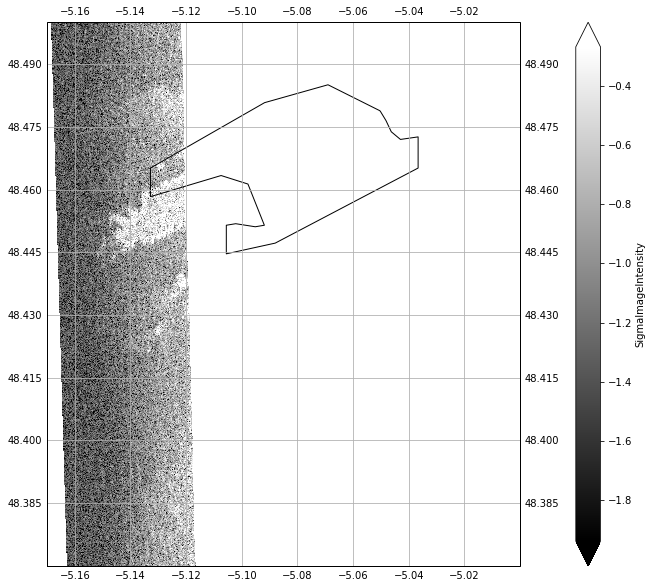

In [18]:
fig = plt.figure(figsize=(20, 10))
ax = fig.add_subplot(1,1,1, projection=ccrs.Mercator())
np.log10(dsm.SigmaImageIntensity.where(dsm.flag_down)).plot(
                                 y='LatImage', x='LonImage',
                                 robust=True, 
                                 cmap='gist_gray',
#                                  vmin=7, vmax=8.8,
                                       transform=ccrs.PlateCarree()
                                           )
ax.coastlines(resolution='10m')
gl=ax.gridlines(draw_labels=True)
ax.set_extent([-5.17, -5., 48.37, 48.5], crs=ccrs.PlateCarree())

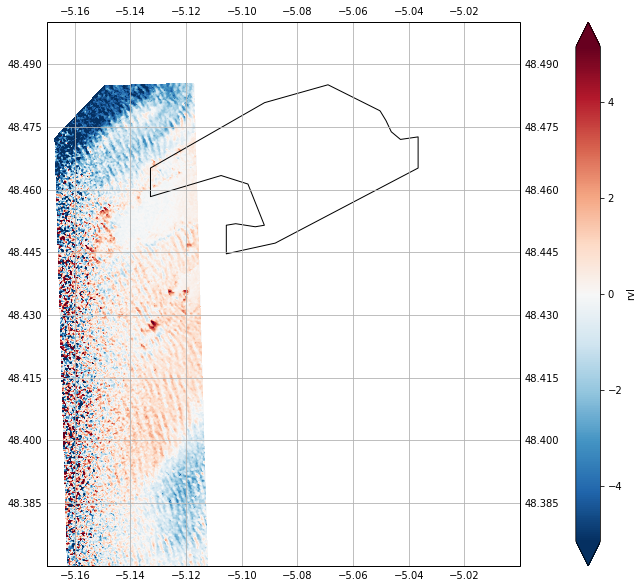

In [59]:
dsa.coords['LonImage'] = dsa.LonImage
dsa.coords['LatImage'] = dsa.LatImage
fig = plt.figure(figsize=(20, 10))
ax = fig.add_subplot(1,1,1, projection=ccrs.Mercator())
dsa.rvl.plot(
                                 y='LatImage', x='LonImage',
                                 robust=True, 
#                                  cmap='gist_gray',
#                                  vmin=7, vmax=8.8,
                                       transform=ccrs.PlateCarree()
                                           )
ax.coastlines(resolution='10m')
gl=ax.gridlines(draw_labels=True)
ax.set_extent([-5.17, -5., 48.37, 48.5], crs=ccrs.PlateCarree())

In [60]:
dsa

<xarray.Dataset>
Dimensions:                                 (AntPatternAngles: 201, CrossRange: 2091, GBPGridInfo: 9, GPSTime: 1297800, GroundRange: 474, ModelTransformationTagCols: 4, ModelTransformationTagRows: 4)
Coordinates:
  * GroundRange                             (GroundRange) float32 1040.0 ... ...
  * CrossRange                              (CrossRange) float32 -11712.0 ......
    LatImage                                (CrossRange, GroundRange) float64 ...
    LonImage                                (CrossRange, GroundRange) float64 ...
  * GPSTime                                 (GPSTime) float64 2.072e+05 ... 2...
  * AntPatternAngles                        (AntPatternAngles) float64 -90.0 ...
  * GBPGridInfo                             (GBPGridInfo) float64 3.447e+05 ....
Dimensions without coordinates: ModelTransformationTagCols, ModelTransformationTagRows
Data variables:
    SigmaImageSingleLookRealPart            (CrossRange, GroundRange) float64 ...
    SigmaImageSingleLookImaginaryPart       (CrossRange, GroundRange) float64 ...
    DEMImage                                (CrossRange, GroundRange) float32 ...
    OrbLatImage                             (CrossRange, GroundRange) float64 ...
    OrbLonImage                             (CrossRange, GroundRange) float64 ...
    OrbHeightImage                          (CrossRange, GroundRange) float64 ...
    OrbTimeImage                            (CrossRange, GroundRange) float64 ...
    OrbitImage                              (CrossRange, GroundRange) float32 ...
    OrbitLatitude                           (GPSTime) float64 ...
    OrbitLongitude                          (GPSTime) float64 ...
    OrbitHeight                             (GPSTime) float64 ...
    OrbitHeading                            (GPSTime) float64 ...
    OrbitRoll                               (GPSTime) float64 ...
    OrbitPitch                              (GPSTime) float64 ...
    TxElevationGain                         (AntPatternAngles) float64 -51.24...
    TxAzimuthGain                           (AntPatternAngles) float64 -87.36...
    RxElevationGain                         (AntPatternAngles) float64 -51.24...
    RxAzimuthGain                           (AntPatternAngles) float64 -87.36...
    ModelTransformationTag                  (ModelTransformationTagCols, ModelTransformationTagRows) float64 ...
    StartYear                               int32 2022
    StartMonth                              int32 5
    StartDay                                int32 17
    StartHour                               int32 9
    StartMin                                int32 32
    StartSec                                float32 21.7155
    FinalYear                               int32 2022
    FinalMonth                              int32 5
    FinalDay                                int32 17
    FinalHour                               int32 9
    FinalMin                                int32 35
    FinalSec                                float32 3.888463
    TxPolarization                          |S1 b'V'
    RxPolarization                          |S1 b'V'
    LookDirection                           |S1 b'L'
    TxPointEl                               float32 49.0
    TxPointAz                               float32 0.0
    RxPointEl                               float32 49.0
    RxPointAz                               float32 0.0
    CentralFreq                             float32 13500000000.0
    TransmittedBandWidth                    float32 19000000.0
    MeanForwardVelocity                     float32 104.55092
    PRF                                     float32 8002.561
    DopplerPresumming                       float32 1.0
    WindowFunction                          float32 3.0
    MinProcessedDoppler                     float32 -4681.1855
    MaxProcessedDoppler                     float32 -1961.5652
    Latitude11                              float64 48.34
    Longitude11          

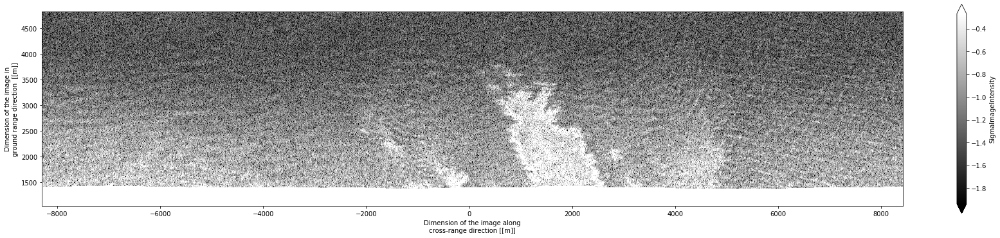

In [19]:
ax = np.log10(dsm.SigmaImageIntensity)\
    .where(dsm.flag_down)\
    .plot(
    figsize=(30, 6),
    y='GroundRange', x='CrossRange',
    cmap='gist_gray',
    robust=True,
)
ax.axes.set_aspect('equal')

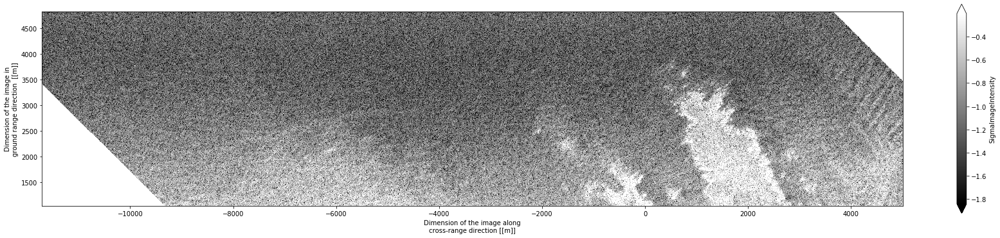

In [20]:
ax = np.log10(dsa.SigmaImageIntensity)\
    .where(dsa.flag_down).plot(
        figsize=(30, 6),
        y='GroundRange', x='CrossRange',
        robust=True, 
        cmap='gist_gray',
#                                  vmin=7, vmax=8.8,
) #vmin=700, vmax=900,
ax.axes.set_aspect('equal')

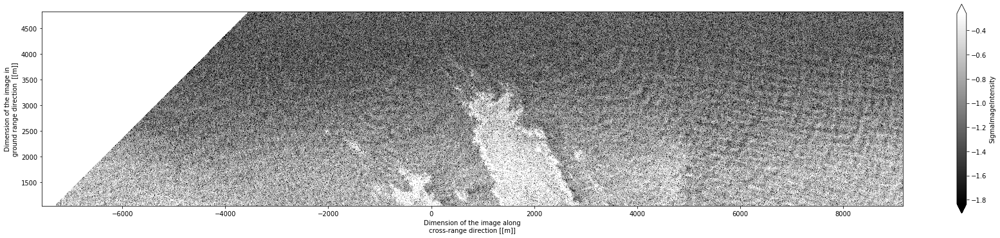

In [21]:
ax = np.log10(dsf.SigmaImageIntensity)\
    .where(dsf.flag_down).plot(
        figsize=(30, 6),
        y='GroundRange', x='CrossRange',
        robust=True, 
        cmap='gist_gray',
#                                  vmin=7, vmax=8.8,
) #vmin=700, vmax=900,
ax.axes.set_aspect('equal')

/Users/admartin/opt/anaconda3/envs/CEASELESS_Sentinel1_RVL/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:995: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanmedian1d, axis, a, overwrite_input)
/Users/admartin/opt/anaconda3/envs/CEASELESS_Sentinel1_RVL/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:995: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanmedian1d, axis, a, overwrite_input)
/Users/admartin/opt/anaconda3/envs/CEASELESS_Sentinel1_RVL/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:995: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanmedian1d, axis, a, overwrite_input)


Text(0.5, 1.0, 'Ouessant 17/05')

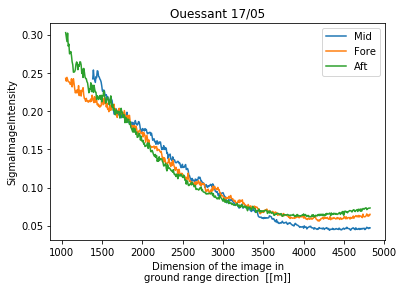

In [22]:
dsm.SigmaImageIntensity.where(dsm.flag_down).median(dim='CrossRange').plot(label='Mid')
dsf.SigmaImageIntensity.where(dsf.flag_down).median(dim='CrossRange').plot(label='Fore')
dsa.SigmaImageIntensity.where(dsa.flag_down).median(dim='CrossRange').plot(label='Aft')
# plt.ylim([0,500])
plt.legend()
plt.title('Ouessant 17/05')

/Users/admartin/opt/anaconda3/envs/CEASELESS_Sentinel1_RVL/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1116: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/admartin/opt/anaconda3/envs/CEASELESS_Sentinel1_RVL/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1116: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/admartin/opt/anaconda3/envs/CEASELESS_Sentinel1_RVL/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1116: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


Text(0.5, 1.0, 'Ouessant 17/05')

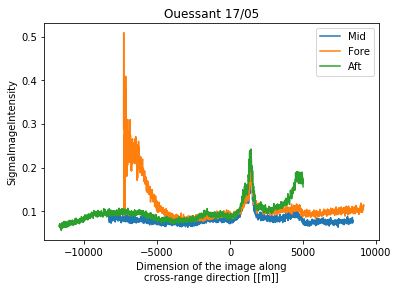

In [23]:
dsm.SigmaImageIntensity.where(dsm.flag_down).median(dim='GroundRange').plot(label='Mid')
dsf.SigmaImageIntensity.where(dsf.flag_down).median(dim='GroundRange').plot(label='Fore')
dsa.SigmaImageIntensity.where(dsa.flag_down).median(dim='GroundRange').plot(label='Aft')
# plt.ylim([0,500])
plt.legend()
plt.title('Ouessant 17/05')

# Coherence

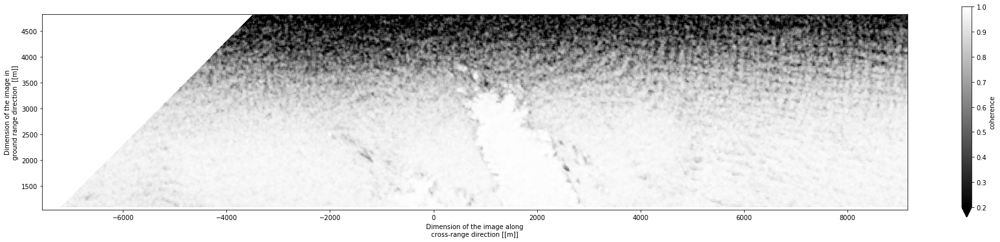

In [24]:
ax = dsf.coherence.plot(figsize=(30, 6),
                        y='GroundRange', x='CrossRange',
                        robust=True, 
                        cmap='gist_gray',
                        vmin=0.2, vmax=1,
                      ) 
                        #            
ax.axes.set_aspect('equal')

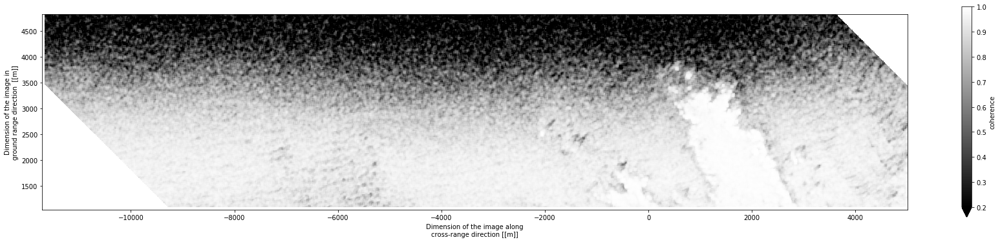

In [25]:
ax = dsa.coherence.plot(figsize=(30, 6),
                        y='GroundRange', x='CrossRange',
                        robust=True, 
                        cmap='gist_gray',
                        vmin=0.2, vmax=1,
                      ) 
                        # vmin=0.9, vmax=1,           
ax.axes.set_aspect('equal')

# Interferogram

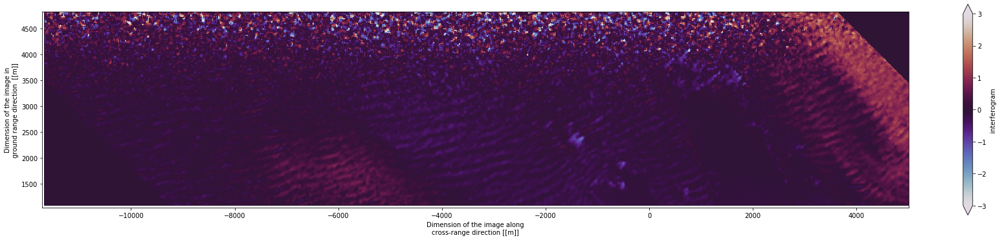

In [26]:
ax = dsa.interferogram.plot(figsize=(30, 6),
                        y='GroundRange', x='CrossRange',
                        robust=True, 
                        cmap='twilight',
                        vmin=-3, vmax=3,
                      ) #vmin=700, vmax=900,
ax.axes.set_aspect('equal')

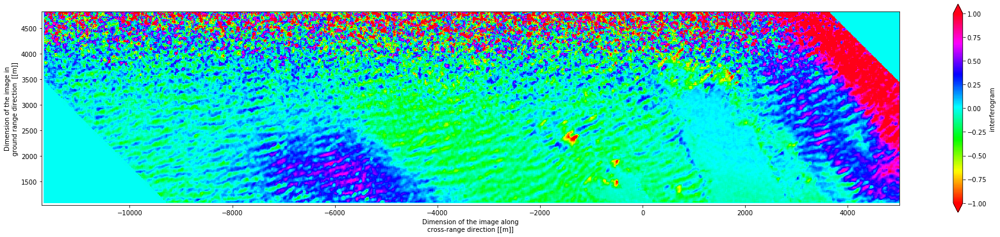

In [45]:
ax = dsa.interferogram.plot(figsize=(30, 6),
                        y='GroundRange', x='CrossRange',
                        robust=True, 
                        cmap='hsv',
                        vmin=-1, vmax=1,
                      ) #vmin=700, vmax=900,
ax.axes.set_aspect('equal')

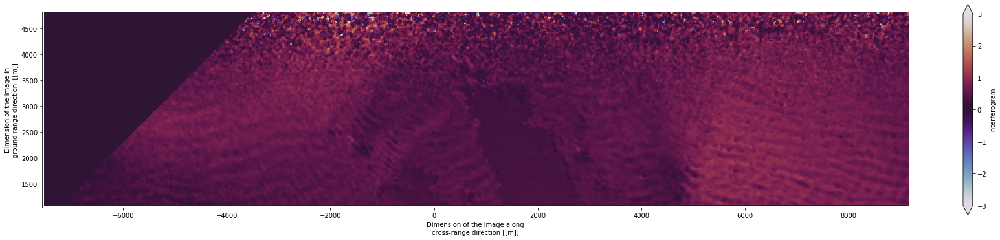

In [27]:
ax = dsf.interferogram.plot(figsize=(30, 6),
                        y='GroundRange', x='CrossRange',
                        robust=True, 
                        cmap='twilight',
                        vmin=-3, vmax=3,
                      ) #vmin=700, vmax=900,
ax.axes.set_aspect('equal')

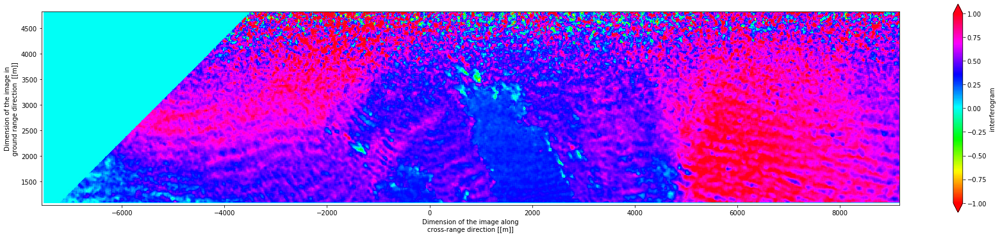

In [48]:
ax = dsf.interferogram.plot(figsize=(30, 6),
                        y='GroundRange', x='CrossRange',
                        robust=True, 
                        cmap='hsv', 
#                             levels=10,
                        vmin=-1, vmax=1,
                      ) #vmin=700, vmax=900,
ax.axes.set_aspect('equal')

In [26]:
data_vars_2D = [
    'SigmaImageSingleLookRealPart',
    'SigmaImageSingleLookImaginaryPart',
    'LatImage',                                
    'LonImage',                                
    'DEMImage',                                
    'OrbLatImage',                             
    'OrbLonImage',                             
    'OrbHeightImage',                          
    'OrbTimeImage',                            
    'OrbitImage',
    'SigmaImageSingleLookRealPartSlave',
    'SigmaImageSingleLookImaginaryPartSlave',
    'OrbLatImageSlave',
    'OrbLonImageSlave',
    'OrbHeightImageSlave',
    'OrbTimeImageSlave',
    'OrbitImageSlave',
]

In [27]:
data_vars_time = [
    'OrbitLatitude',
    'OrbitLongitude',
    'OrbitHeight',           
    'OrbitHeading',       
    'OrbitRoll',             
    'OrbitPitch',            
]

In [28]:
data_vars_pattern = [
    'TxElevationGain',
    'TxAzimuthGain',
    'RxElevationGain',
    'RxAzimuthGain',
    'TxElevationGainSlave',
    'TxAzimuthGainSlave',
    'RxElevationGainSlave',
    'RxAzimuthGainSlave',
]

/Users/admartin/opt/anaconda3/envs/CEASELESS_Sentinel1_RVL/lib/python3.7/site-packages/xarray/plot/utils.py:421: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  _, ax = plt.subplots(figsize=figsize)


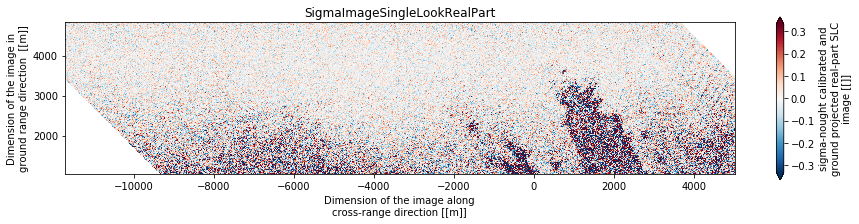

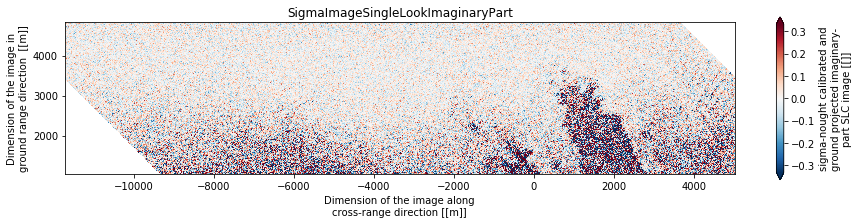

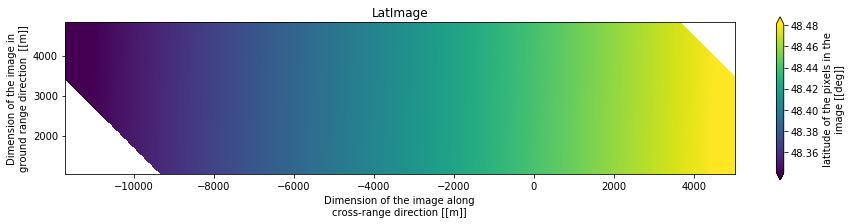

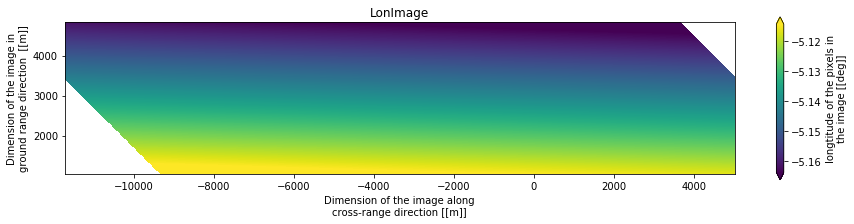

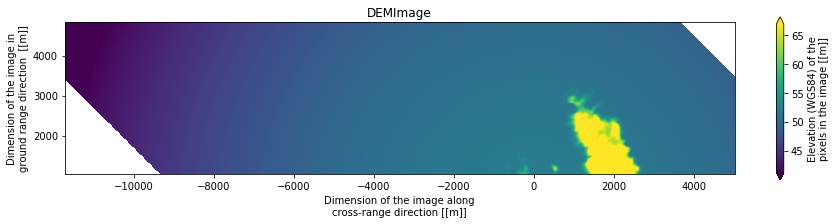

...

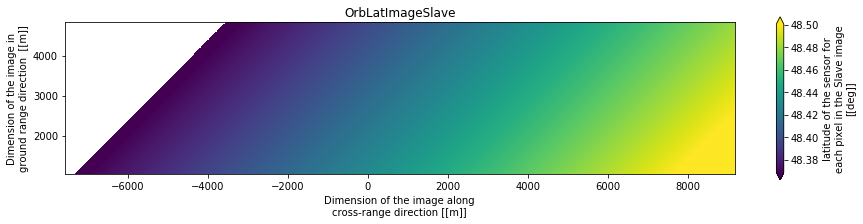

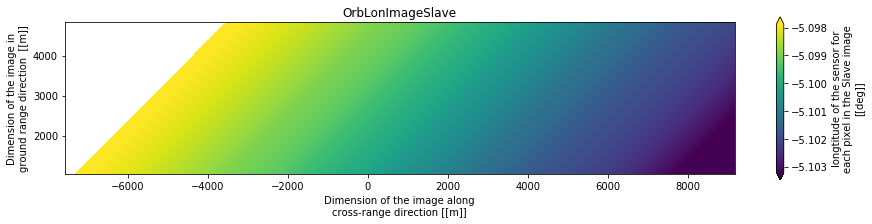

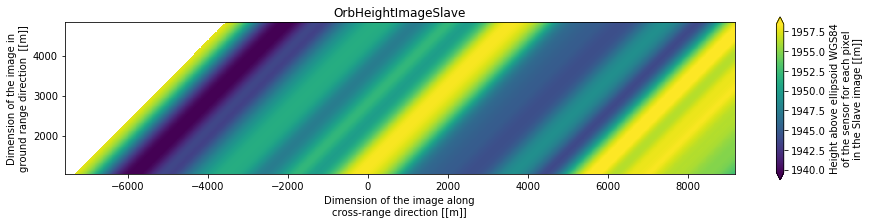

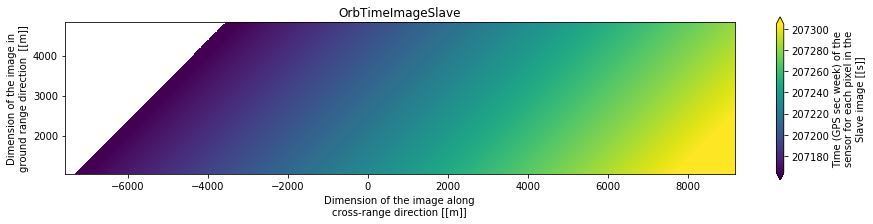

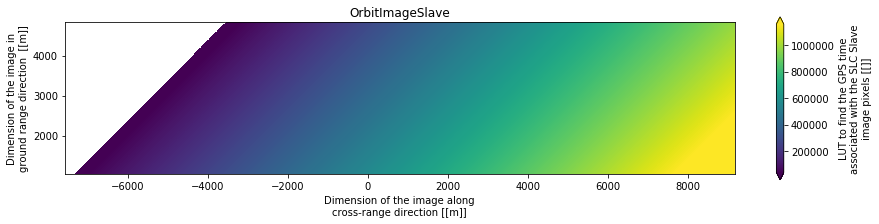

In [29]:
for ds in [dsa, dsf]:
    for var in data_vars_2D:
        ax = ds[var].where(ds.flag_down).plot(
                figsize=(15, 3),
                y='GroundRange', x='CrossRange',
                robust=True
                )
        ax.axes.set_aspect('equal')
        plt.title(var)

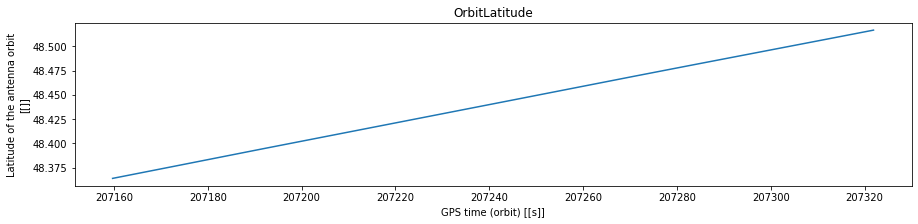

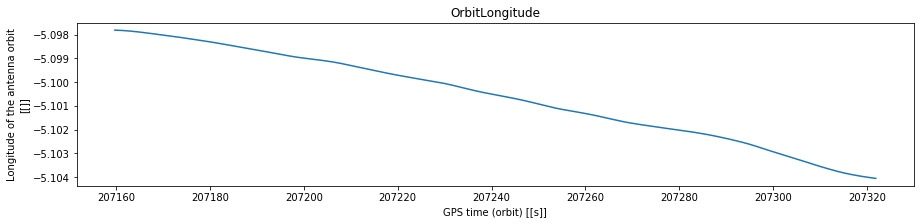

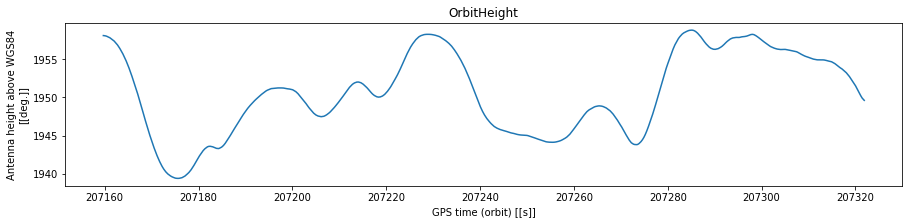

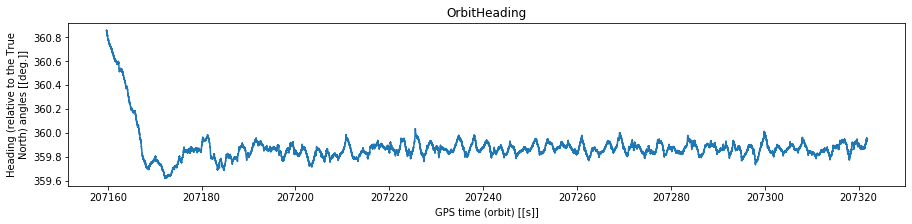

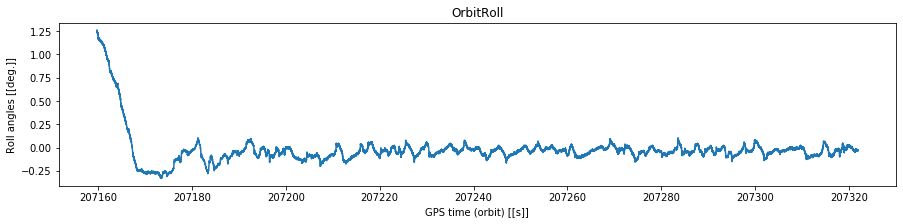

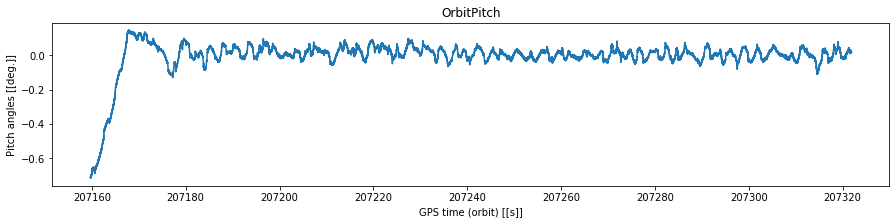

In [30]:
for var in data_vars_time:
    ax = ds[var].plot(
            figsize=(15, 3),
            )
#     ax.axes.set_aspect('equal')
    plt.title(var)

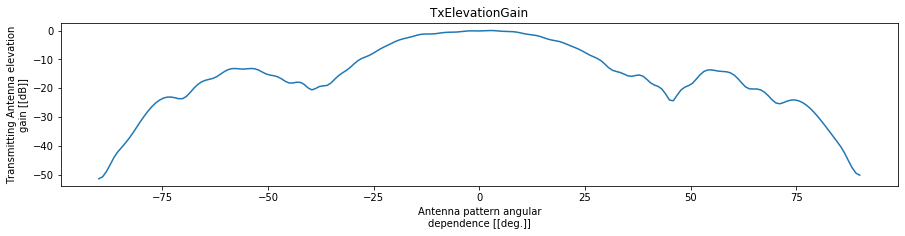

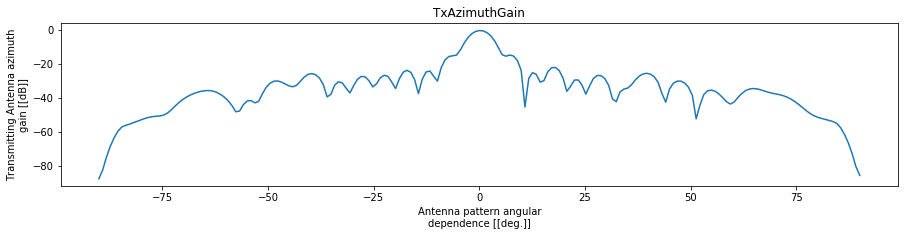

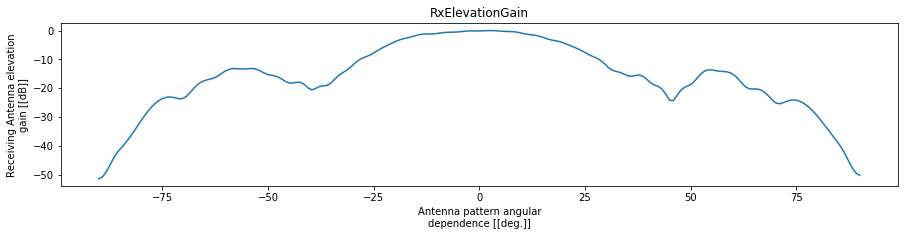

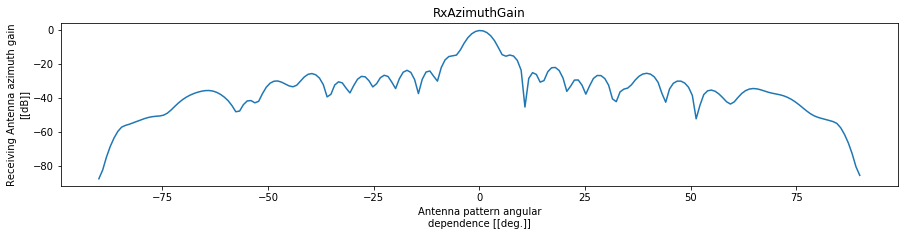

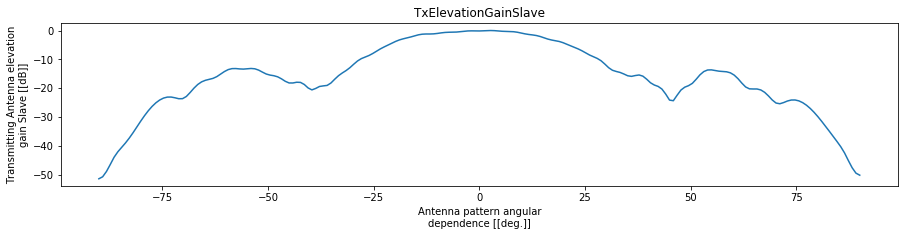

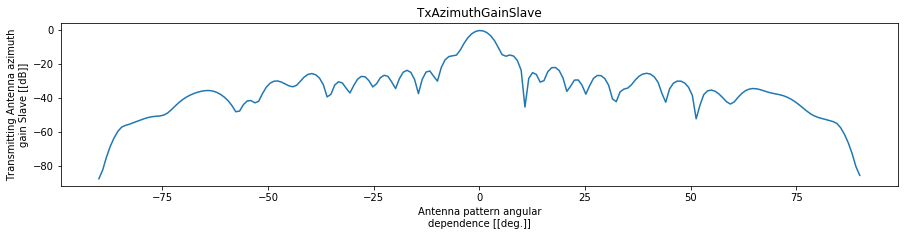

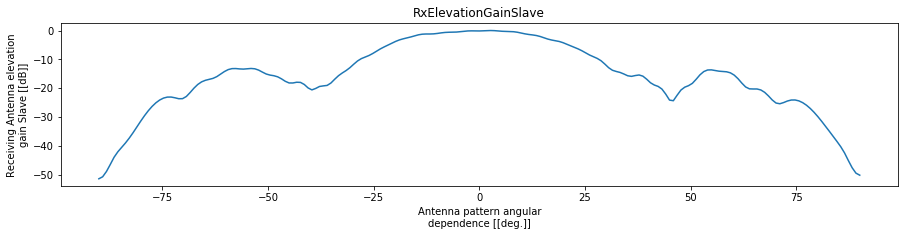

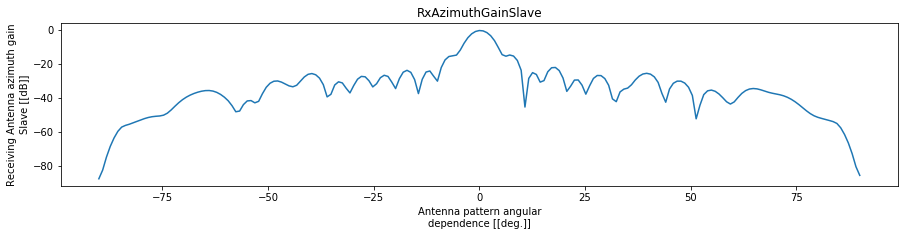

In [31]:
for var in data_vars_pattern:
    ax = ds[var].plot(
            figsize=(15, 3),
            )
#     ax.axes.set_aspect('equal')
    plt.title(var)

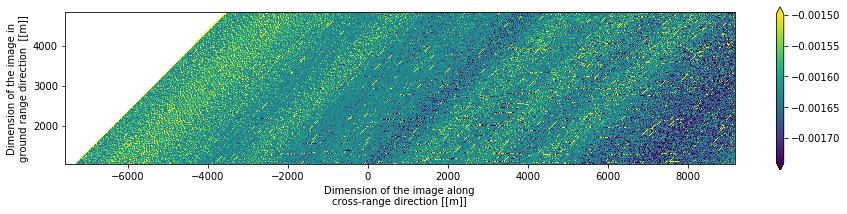

In [32]:
ax = ( dsf.OrbTimeImage - dsf.OrbTimeImageSlave ).plot(
            figsize=(15, 3),
            y='GroundRange', x='CrossRange',
            robust=True)
ax.axes.set_aspect('equal')
# About 1.6 ms

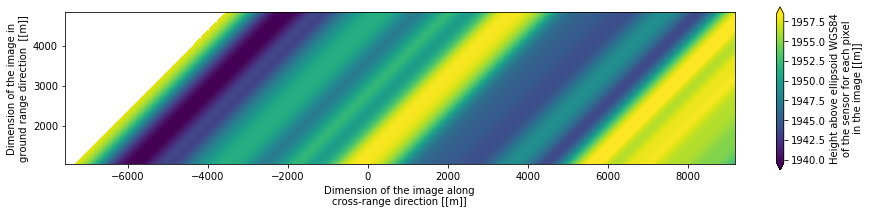

In [33]:
ax = dsf.OrbHeightImage.plot(
                figsize=(15, 3),
                y='GroundRange', x='CrossRange',
                robust=True
                )
ax.axes.set_aspect('equal')

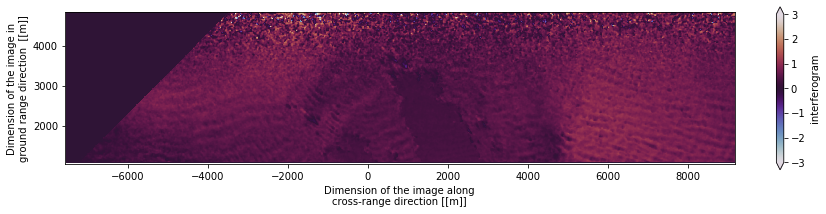

In [34]:
ax = dsf.interferogram.plot(figsize=(15, 3),
                        y='GroundRange', x='CrossRange',
                        robust=True, 
                        cmap='twilight',
                        vmin=-3, vmax=3,
                      ) #vmin=700, vmax=900,
ax.axes.set_aspect('equal')

In [50]:
#rvl = phy / ( k_e * tau * sin(theta) )
f_e = 13.5 * 10**9
c = 3 * 10**8
k_e = 2 * np.pi * f_e / c
dsf['tau'] = ( dsf.OrbTimeImage - dsf.OrbTimeImageSlave )
dsf['rvl'] = dsf.interferogram / ( dsf.tau * k_e *.5)
dsa['tau'] = ( dsa.OrbTimeImage - dsa.OrbTimeImageSlave )
dsa['rvl'] = dsa.interferogram / ( dsa.tau * k_e *.5)

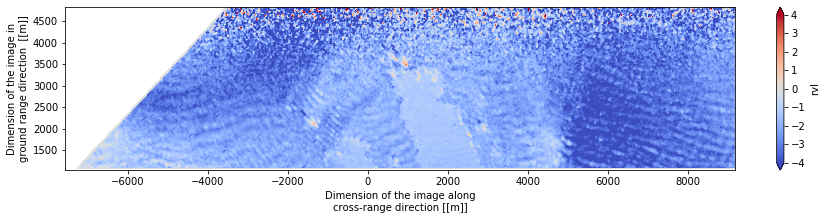

In [54]:
dsf.rvl.plot(
    figsize=(15, 3),
    y='GroundRange', x='CrossRange',
    robust=True, 
    cmap='coolwarm',
    vmin=-4, vmax=+4,
#     cmap='twilight',
)
ax.axes.set_aspect('equal')

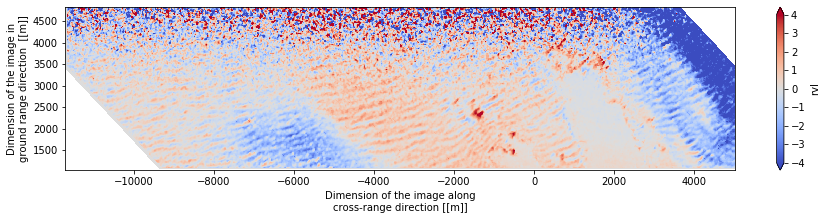

In [55]:
dsa.rvl.plot(
    figsize=(15, 3),
    y='GroundRange', x='CrossRange',
    robust=True,
#     cmap='viridis',
    cmap='coolwarm',
    vmin=-4, vmax=+4,
#     cmap='twilight',
)
ax.axes.set_aspect('equal')

# Ocean 25/05

In [38]:
dsm25ocean = xr.open_dataset(
    dirIn + list25ocean[0],
)
dsm25ocean['flag_down'] = dsm25ocean.SigmaImageSingleLookRealPart != -9999.
dsm25ocean = computeL1b( dsm25ocean, window=7 )

In [39]:
dsf25ocean = xr.open_dataset(
    dirIn + list25ocean[1],
)
dsf25ocean['flag_down'] = dsf25ocean.SigmaImageSingleLookRealPart != -9999.
dsf25ocean = computeL1b( dsf25ocean, window=7 )

/Users/admartin/opt/anaconda3/envs/CEASELESS_Sentinel1_RVL/lib/python3.7/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)


In [53]:
dsa25ocean = xr.open_dataset(
    dirIn + list25ocean[2],
)
dsa25ocean['flag_down'] = dsa25ocean.SigmaImageSingleLookRealPart != -9999.
dsa25ocean = computeL1b( dsa25ocean, window=7 )

/Users/admartin/opt/anaconda3/envs/CEASELESS_Sentinel1_RVL/lib/python3.7/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)


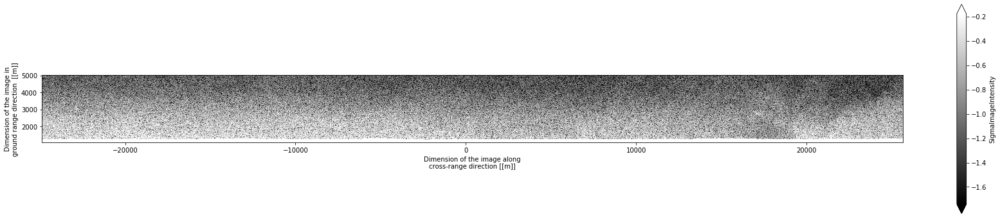

In [41]:
ax = np.log10(dsm25ocean.SigmaImageIntensity)\
    .where(dsm25ocean.flag_down)\
    .plot(
    figsize=(30, 6),
    y='GroundRange', x='CrossRange',
    cmap='gist_gray',
    robust=True,
)
ax.axes.set_aspect('equal')

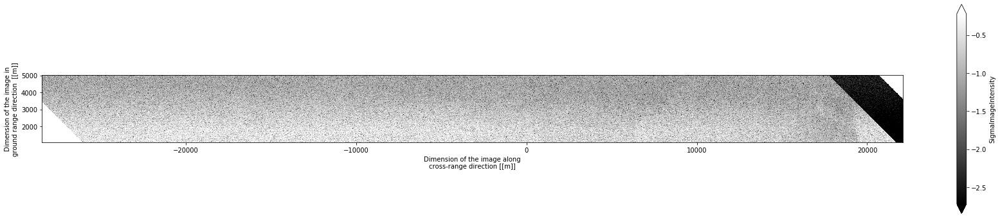

In [54]:
ax = np.log10(dsa25ocean.SigmaImageIntensity)\
    .where(dsa25ocean.flag_down).plot(
        figsize=(30, 6),
        y='GroundRange', x='CrossRange',
        robust=True, 
        cmap='gist_gray',
#                                  vmin=7, vmax=8.8,
) #vmin=700, vmax=900,
ax.axes.set_aspect('equal')

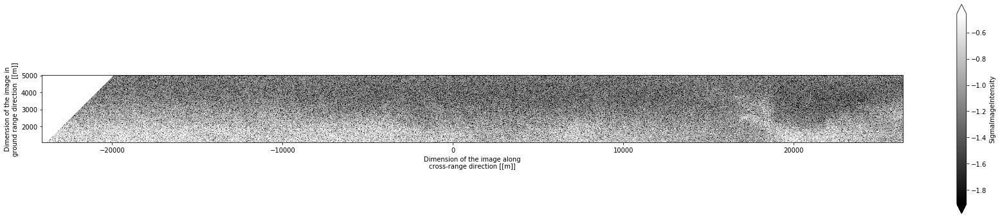

In [43]:
ax = np.log10(dsf25ocean.SigmaImageIntensity)\
    .where(dsf25ocean.flag_down).plot(
        figsize=(30, 6),
        y='GroundRange', x='CrossRange',
        robust=True, 
        cmap='gist_gray',
#                                  vmin=7, vmax=8.8,
) #vmin=700, vmax=900,
ax.axes.set_aspect('equal')

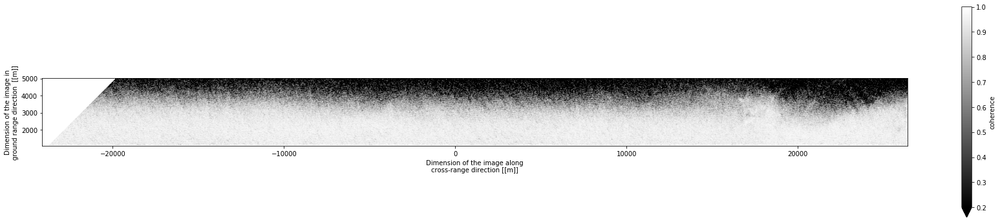

In [44]:
ax = dsf25ocean.coherence.plot(figsize=(30, 6),
                        y='GroundRange', x='CrossRange',
                        robust=True, 
                        cmap='gist_gray',
                        vmin=0.2, vmax=1,
                      ) 
                        #            
ax.axes.set_aspect('equal')

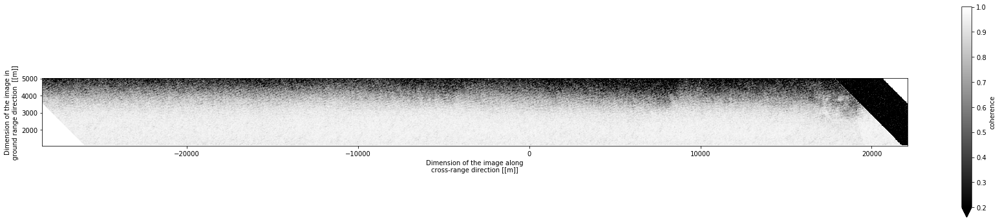

In [55]:
ax = dsa25ocean.coherence.plot(figsize=(30, 6),
                        y='GroundRange', x='CrossRange',
                        robust=True, 
                        cmap='gist_gray',
                        vmin=0.2, vmax=1,
                      ) 
                        # vmin=0.9, vmax=1,           
ax.axes.set_aspect('equal')

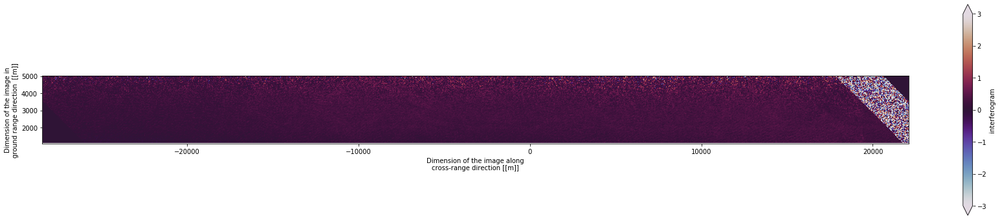

In [56]:
ax = dsa25ocean.interferogram.plot(figsize=(30, 6),
                        y='GroundRange', x='CrossRange',
                        robust=True, 
                        cmap='twilight',
                        vmin=-3, vmax=3,
                      ) #vmin=700, vmax=900,
ax.axes.set_aspect('equal')

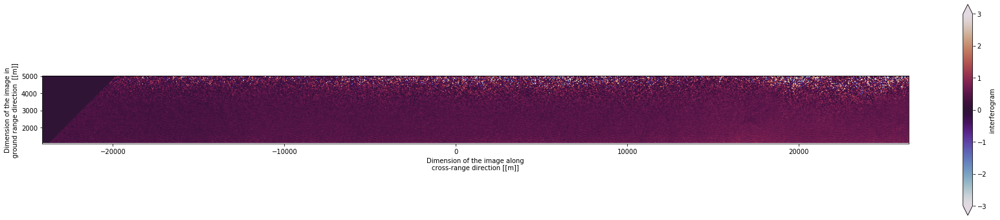

In [47]:
ax = dsf25ocean.interferogram.plot(figsize=(30, 6),
                        y='GroundRange', x='CrossRange',
                        robust=True, 
                        cmap='twilight',
                        vmin=-3, vmax=3,
                      ) #vmin=700, vmax=900,
ax.axes.set_aspect('equal')

/Users/admartin/opt/anaconda3/envs/CEASELESS_Sentinel1_RVL/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:995: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanmedian1d, axis, a, overwrite_input)
/Users/admartin/opt/anaconda3/envs/CEASELESS_Sentinel1_RVL/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:995: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanmedian1d, axis, a, overwrite_input)
/Users/admartin/opt/anaconda3/envs/CEASELESS_Sentinel1_RVL/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:995: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanmedian1d, axis, a, overwrite_input)


Text(0.5, 1.0, 'Open Ocean 25/05')

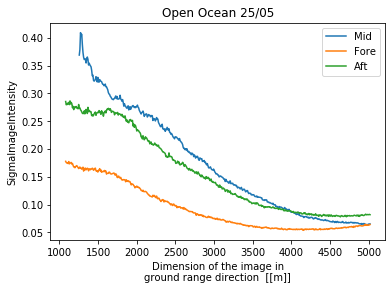

In [59]:
dsm25ocean.SigmaImageIntensity.where(dsm25ocean.flag_down).median(dim='CrossRange').plot(label='Mid')
dsf25ocean.SigmaImageIntensity.where(dsf25ocean.flag_down).median(dim='CrossRange').plot(label='Fore')
dsa25ocean.SigmaImageIntensity.where(dsa25ocean.flag_down).median(dim='CrossRange').plot(label='Aft')
# plt.ylim([0,500])
plt.legend()
plt.title('Open Ocean 25/05')

/Users/admartin/opt/anaconda3/envs/CEASELESS_Sentinel1_RVL/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1116: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/admartin/opt/anaconda3/envs/CEASELESS_Sentinel1_RVL/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1116: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/admartin/opt/anaconda3/envs/CEASELESS_Sentinel1_RVL/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1116: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


Text(0.5, 1.0, 'Open Ocean 25/05')

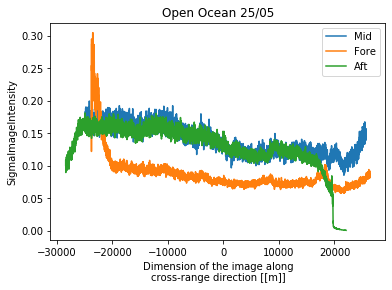

In [62]:
dsm25ocean.SigmaImageIntensity.where(dsm25ocean.flag_down).median(dim='GroundRange').plot(label='Mid')
dsf25ocean.SigmaImageIntensity.where(dsf25ocean.flag_down).median(dim='GroundRange').plot(label='Fore')
dsa25ocean.SigmaImageIntensity.where(dsa25ocean.flag_down).median(dim='GroundRange').plot(label='Aft')
# plt.ylim([0,500])
plt.legend()
plt.title('Open Ocean 25/05')